# Lab 2 Overview
## First Half
More Visualisations:
- Map Clusters
- Heatmaps (GIS)
- HexBins vs SquareBins 
- Choropleths

Descriptive Statistics:
- Histograms and looking at the distribution shape.
- How to "quick plot" dataframes using `pandas`.
- Some methods of determining bin sizes.

## Second Half
Revision:
- Any code related questions for Python
- (Windows 10 Users) Installing WSL2 (Ubuntu 20.04) for a clean environment.

Advanced Content:
- Introduction to `PySpark`.

_________________


### Visualisations
- Clustering points
- Binned plots
- Good visualizations vs Bad visualizastions


### Personal Checklist for Visualisations and Dashboards:
1. Your visualisation needs to tell a story.
2. It should be intepretable without being overly verbose.
3. The scale and axis need to make sense (and you can assume the reader knows the difference between a normal scale vs log scale).
4. The choice of visualisation needs to make sense:
    - Line plot vs Bar chart with non-numerical categories
    - Map plot with points vs clusters for each location
    - Scatterplot vs Histogram plot to see distribution
    - etc
5. Choice of colour scheme / alpha / size need to be easy on the eyes.

At the end of the day, even if you think your visualisation is "pretty" or "beautiful", if a reader cannot understand it, then it is not a good visualisation

In [1]:
import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings("ignore")

In [2]:
# read in the data
df = pd.read_feather("../data/lab_specific/sample.feather").drop('index', axis=1)

df.tail()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RatecodeID,store_and_fwd_flag,dropoff_longitude,...,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,pickupX,pickupY,dropoffX,dropoffY
98502,2,4/12/15 22:55,4/12/15 23:03,1,0.75,-73.994370,40.746239,1,N,-73.980774,...,0.5,0.5,0.00,0.0,0.3,7.80,-8.237016e+06,4.974984e+06,-8.235502e+06,4.974382e+06
98503,1,4/12/15 22:55,4/12/15 23:08,1,2.40,-73.968346,40.759735,1,N,-73.969879,...,0.5,0.5,0.00,0.0,0.3,12.30,-8.234119e+06,4.976967e+06,-8.234289e+06,4.980647e+06
98504,1,4/12/15 22:55,4/12/15 23:01,1,0.80,-73.993484,40.742168,1,N,-73.984390,...,0.5,0.5,1.45,0.0,0.3,8.75,-8.236917e+06,4.974386e+06,-8.235905e+06,4.975537e+06
98505,2,4/12/15 22:55,4/12/15 23:17,1,4.73,-73.984993,40.747929,1,N,-73.981552,...,0.5,0.5,3.96,0.0,0.3,23.76,-8.235972e+06,4.975232e+06,-8.235589e+06,4.966693e+06
98506,2,4/12/15 22:55,4/12/15 22:59,2,0.80,-73.975731,40.751968,1,N,-73.981247,...,0.5,0.5,1.16,0.0,0.3,6.96,-8.234941e+06,4.975826e+06,-8.235555e+06,4.974377e+06


### Clustering
- Excellent tool when visualising geospatial coordinates
- Aggregates certain "areas" to make distributions far easier to interpret

Questions:
- *How is this worse/better than the previous scatter plot?*
- *Does this plot give us any useful information?*

In [3]:
import folium
from folium.plugins import FastMarkerCluster

# lat, long
COORDS = ['pickup_latitude', 'pickup_longitude']

# create an interactive geospatial graph
pickups_cluster = folium.Map(location=[40.66, -73.94], tiles="Stamen Terrain", zoom_start=10)

# use a built-in clustering algorithm to apply markers for hotspots
FastMarkerCluster(data=df[COORDS].values).add_to(pickups_cluster)

# visualize the plot 
pickups_cluster.save('../plots/foliumFastCluster.html')
pickups_cluster

### Heatmaps
- Similar to clustering with respect to visualising geospatial coordinates.
- Allows for a more continuous interpretation of the map, rather than clusters.

Questions:
- *In terms of pickups, why might we prefer or not prefer this over a cluster map?*

In [4]:
from folium.plugins import HeatMap

pickups_heatmap = folium.Map(location=[40.66, -73.94], tiles="Stamen Terrain", zoom_start=10)
pickups_heatmap.add_child(HeatMap(df[COORDS].values, radius=10))

pickups_heatmap.save('../plots/foliumPickupHeatmap.html')
pickups_heatmap

In [5]:
dropoffs_heatmap = folium.Map(location=[40.66, -73.94], tiles="Stamen Terrain", zoom_start=10)
dropoffs_heatmap.add_child(HeatMap(df[['dropoff_latitude', 'dropoff_longitude']].values, radius=10))

dropoffs_heatmap.save('../plots/foliumDropoffHeatmap.html')
dropoffs_heatmap

### Hex Binned Plots
- An extension of heatmaps that discretises the points.
- Gives a greater granularity to the map when looking at geospatial coordinates.

In [6]:
from bokeh.plotting import figure, show
from bokeh.tile_providers import get_provider, Vendors
from bokeh.io import save, reset_output, output_notebook

TILE = get_provider("STAMEN_TERRAIN_RETINA")

reset_output()
output_notebook()
# note below that it says "BokehJS 1.4.0 successfully loaded."

Loading BokehJS ...

In [7]:
df[COORDS].describe()

,pickup_latitude,pickup_longitude
count,98507.000000,98507.000000
mean,40.749236,-73.975071
std,0.027173,0.037777
min,40.396660,-74.331802
25%,40.735222,-73.992630
50%,40.751514,-73.982666
75%,40.766067,-73.970196
max,40.928226,-73.306190


In [8]:
df.dropna(inplace=True)

# create left and right boundaries for the x and y axis respectively
xRange = [-74, -73.9]
yRange = [40.5, 40.9]

def lat2mercer(coords):
    k = 6378137
    converted = list()
    for lat in coords:
        converted.append(np.log(np.tan((90 + lat) * np.pi/360.0)) * k)
    return converted

def lon2mercer(coords):
    k = 6378137
    converted = list()
    for lon in coords:
        converted.append(lon * (k * np.pi/180.0))
    return converted

# convert to mercer
df['pickupX'] = df['pickup_longitude'].apply(lambda x: lon2mercer([x])[0])
df['pickupY'] = df['pickup_latitude'].apply(lambda x: lat2mercer([x])[0])

In [9]:
# create bokeh figure, where x_range and y_range are in mercer
p = figure(x_range=lon2mercer(xRange), y_range=lat2mercer(yRange),
           x_axis_type="mercator", y_axis_type="mercator")
# add map tile
p.add_tile(TILE)
# change title
p.title.text = "Hex-Binned Pickups in NYC"

# add hexbin (size param is the bin size - more about it next week)
p.hexbin(x=df['pickupX'], y=df['pickupY'], size=250)

show(p)
save(p, '../plots/bokehPickupHexBinned.html')

'/mnt/c/users/akira/documents/github/MAST30034/plots/bokehPickupHexBinned.html'

An alternative using matplotlib. Although fast, it's not useful without the underlying geospatial features.

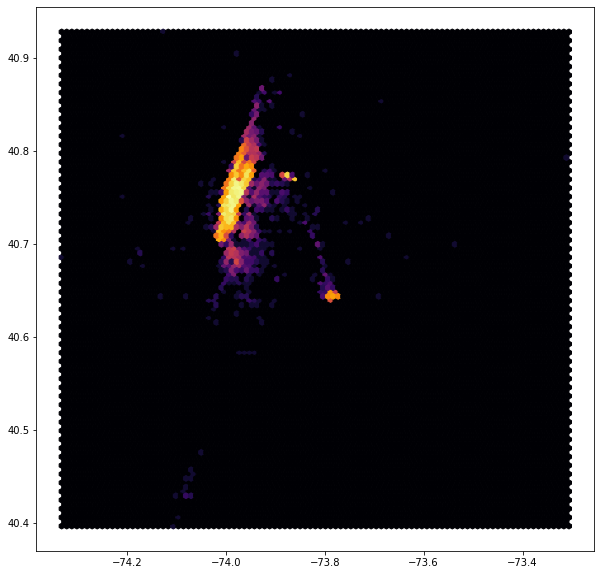

In [10]:
import matplotlib.pyplot as plt

test = df.dropna()
plt.figure(figsize=(10,10))

plt.hexbin(x = test[COORDS[1]], y= test[COORDS[0]],
           gridsize=100, bins='log', cmap='inferno')

plt.show()

_________________


### Shapefile Overlays
- **NOTE: This only applies on the more recent datasets that use zones over coordinates**

Requirements:
- `geopandas`

Shapefile Links:
- https://s3.amazonaws.com/nyc-tlc/misc/taxi_zones.zip
- https://s3.amazonaws.com/nyc-tlc/misc/taxi+_zone_lookup.csv

Installation:
- MacOS and Linux users use `pip install geopandas` or equivalent
- Windows users will need to visit another guide.

Manual:
1. Visit https://www.lfd.uci.edu/~gohlke/pythonlibs/
2. You will need 2 different `.whl` (wheel) files. These are `GDAL` and `Fiona`.
3. Find both of them and download the version **corresponding to your device OS and Python**. For example, a 64-bit Windows 10 device running Python 3.8.X will need to download this file for `GDAL`. Repeat this for `Fiona` as well. (For your convenience, a fresh installation of Ubuntu 20.04 will yield Python 3.8.3, and most modern devices all run on 64-bit architecture. I have provided these in the `geopandas_dependencies` folder)

![gdal](./geopandas_dependencies/tute.PNG)

4. Once they are downloaded, you will need to open up command prompt and `cd` into the directory. For example, if my `.whl` files are in the `geopandas_dependencies` folder, the command I would use is:
    - `cd C:\Users\USERNAME\Documents\GitHub\MAST30034Repo\workbook\geopandas_dependencies`
5. Install the dependencies in this order:
    - `pip install GDAL-3.1.2-cp37-cp37m-win_amd64.whl` (or the corresponding file you downloaded)
    - `pip install Fiona-1.8.13-cp37-cp37m-win_amd64.whl`
6. Run `pip install geopandas` and it should now work

In [11]:
df = pd.read_csv("../data/lab_specific/yellow_tripdata_2019-01.csv")
df.groupby('PULocationID')['payment_type'].count().reset_index().sort_values('payment_type', ascending=False)

,PULocationID,payment_type
84,161,434
123,236,427
124,237,414
95,186,392
117,230,356
...,...,...
44,86,1
47,89,1
109,218,1
110,222,1


In [12]:
import geopandas as gpd

# sf stands for shape file
sf = gpd.read_file("../Data/taxi_zones/taxi_zones.shp")
zone = pd.read_csv("../Data/taxi_zones/taxi+_zone_lookup.csv")

# Convert the geometry shaape to to latitude and longitude
# Please attribute this if you are using it
sf['geometry'] = sf['geometry'].to_crs("+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs")

In [13]:
sf

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
0,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((-74.18445 40.69500, -74.18449 40.695..."
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ..."
2,3,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,"POLYGON ((-73.84793 40.87134, -73.84725 40.870..."
3,4,0.043567,0.000112,Alphabet City,4,Manhattan,"POLYGON ((-73.97177 40.72582, -73.97179 40.725..."
4,5,0.092146,0.000498,Arden Heights,5,Staten Island,"POLYGON ((-74.17422 40.56257, -74.17349 40.562..."
...,...,...,...,...,...,...,...
258,259,0.126750,0.000395,Woodlawn/Wakefield,259,Bronx,"POLYGON ((-73.85107 40.91037, -73.85207 40.909..."
259,260,0.133514,0.000422,Woodside,260,Queens,"POLYGON ((-73.90175 40.76078, -73.90147 40.759..."
260,261,0.027120,0.000034,World Trade Center,261,Manhattan,"POLYGON ((-74.01333 40.70503, -74.01327 40.704..."
261,262,0.049064,0.000122,Yorkville East,262,Manhattan,"MULTIPOLYGON (((-73.94383 40.78286, -73.94376 ..."


Common Conventions:
- `gdf` stands for GeoDataFrame.
- Now, we need to create a `gdf` with our current dataframe and shapefile data.

From `df`, we join using `PULocationID` to match from `sf`'s `LocationID`

In [14]:
gdf = gpd.GeoDataFrame(pd.merge(df, sf, left_on='PULocationID', right_on='LocationID')).drop('PULocationID',axis=1)
gdf.sample(2)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,DOLocationID,payment_type,fare_amount,...,improvement_surcharge,total_amount,congestion_surcharge,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
8293,2,2019-01-22 08:01:34,2019-01-22 08:19:52,1,2.91,1,N,234,1,13.5,...,0.3,17.16,0.0,43,0.099739,0.000380,Central Park,43,Manhattan,"POLYGON ((-73.97255 40.76490, -73.97301 40.764..."
7145,2,2019-01-24 14:22:02,2019-01-24 14:31:42,2,1.42,1,N,107,2,8.0,...,0.3,8.80,0.0,233,0.048036,0.000116,UN/Turtle Bay South,233,Manhattan,"MULTIPOLYGON (((-73.96547 40.75194, -73.96532 ..."


Now, lets try plot this with `folium`. There are two ways to approach this kind of task:
- Plot all the data!
- Aggregate *before* plotting data!

It's up to you to decide which to use...

Specifically with `folium`, you will need to create a GeoJSON format. You can view more information using the documentation.

In [15]:
geoJSON = gdf[['LocationID','geometry']].drop_duplicates('LocationID').to_json()

This plot is just shapefiles based on the locations and **does not** show any analysis.

Use this as a reference on how you can plot shapefiles...

In [16]:
m = folium.Map(location=[40.66, -73.94], tiles="Stamen Terrain", zoom_start=10)

# refer to the folium documentations on how to plot aggregated data.
folium.Choropleth(
    geo_data=geoJSON,
    name='choropleth',
).add_to(m)

m.save('../plots/foliumChoroplethMap.html')
m

_________________


###  Descriptive Statistics
- Hopefully nothing here is *new* to you...
- This tutorial is more about efficiently getting there and some food for thought.

In [17]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [18]:
# read in the data
df = pd.read_feather("../data/lab_specific/sample.feather").dropna().drop('index', axis=1)

# describe our data
df.describe()

,VendorID,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RatecodeID,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,pickupX,pickupY,dropoffX,dropoffY
count,98507.000000,98507.000000,98507.000000,98507.000000,98507.000000,98507.000000,98507.000000,98507.000000,98507.000000,98507.000000,98507.000000,98507.000000,98507.000000,98507.000000,98507.000000,98507.000000,9.850700e+04,9.850700e+04,9.850700e+04,9.850700e+04
mean,1.532135,1.708041,2.831586,-73.975071,40.749236,1.026110,-73.864641,40.688729,1.339306,12.741628,0.605104,0.498604,1.799571,0.239626,0.299753,16.184287,-8.234867e+06,4.975425e+06,-8.222574e+06,4.968065e+06
std,0.498969,1.307988,3.374462,0.037777,0.027173,0.234023,2.875083,1.583989,0.487067,9.788342,0.227483,0.029212,2.269767,1.181096,0.011586,11.848473,4.205283e+03,3.991693e+03,3.200528e+05,1.934214e+05
min,1.000000,0.000000,0.000000,-74.331802,40.396660,1.000000,-74.624863,0.000000,1.000000,-80.000000,-1.000000,-0.500000,0.000000,0.000000,-0.300000,-80.300000,-8.274578e+06,4.923752e+06,-8.307202e+06,-7.081155e-10
25%,1.000000,1.000000,1.030000,-73.992630,40.735222,1.000000,-73.991890,40.732037,1.000000,7.000000,0.500000,0.500000,0.000000,0.000000,0.300000,9.300000,-8.236822e+06,4.973365e+06,-8.236740e+06,4.972897e+06
50%,2.000000,1.000000,1.710000,-73.982666,40.751514,1.000000,-73.981613,40.750854,1.000000,10.000000,0.500000,0.500000,1.460000,0.000000,0.300000,12.800000,-8.235713e+06,4.975759e+06,-8.235596e+06,4.975662e+06
75%,2.000000,2.000000,3.100000,-73.970196,40.766067,1.000000,-73.965488,40.769051,2.000000,15.000000,0.500000,0.500000,2.550000,0.000000,0.300000,18.360000,-8.234325e+06,4.977898e+06,-8.233801e+06,4.978336e+06
max,2.000000,6.000000,91.200000,-73.306190,40.928226,5.000000,0.000000,41.487267,4.000000,500.000000,1.500000,0.500000,115.000000,24.000000,0.300000,550.300000,-8.160408e+06,5.001761e+06,0.000000e+00,5.084481e+06


- Remember that not all the data should be interpreted as purely numerical...
- There may be conclusions you can draw *by coincidence* if you incorrectly assume data types!
- For example:
    - `longitude` and `latitude` should be interpreted as geospatial coordinates
    - `payment_type` is a discrete category of payment types
    - `trip_distance` is non-linear (not a straight line from A to B), but we have no further data on it. It is also in **miles**.
- To avoid misinterpreting the attributes, refer to the data dictionary provided on the TLC website.

### Scatterplot plots for Fare / Distance

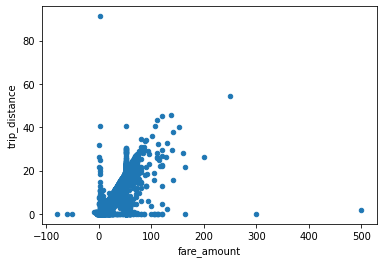

In [19]:
df[['fare_amount', 'trip_distance']].plot.scatter(x='fare_amount',
                                                  y='trip_distance')

plt.show()

General Inference:
- We can visually see that the relationship is relatively linear as you'd expect (more distance generally means more money)
- A fair number of outliers, notably around the 0 distance axis and 0 cost axis. Why might this be the case?
- Why are there negative values?

### Histogram plots for Trip Distance

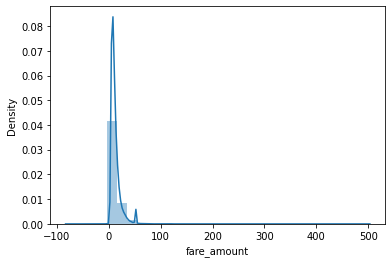

In [20]:
sns.distplot(df['fare_amount'], bins=30)

plt.show()

- I guess we can kind of see most fares are between 0 - 100.
- Hard to tell where the main distribution is spread around.
- We can enhance this using a log transformation.

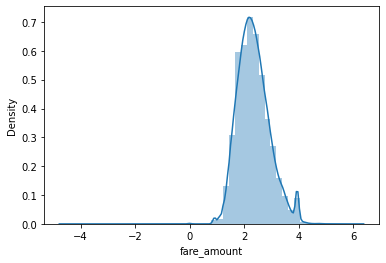

In [21]:
from numpy import log, sqrt

# apply a log transformation for all x non-zero x points, else 0
def logify(x):
    return log(x) if x else 0

sns.distplot(df['fare_amount'].apply(logify), bins=50)
plt.show()

A one-line `lambda` alternative.

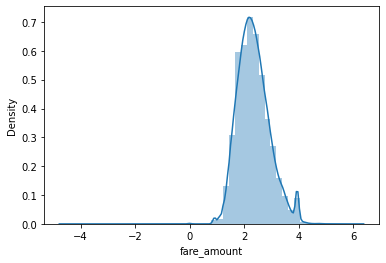

In [22]:
sns.distplot(df['fare_amount'].apply(lambda x: log(x) if x else 0), bins=50)
plt.show()

- Take a log transformation to visually see the distribution
- Now we see most the values fall under `exp(x)`, majority between `$7` - `$55` (`exp(2)` - `exp(55)`)

How about the distribution for trips under 15 miles?

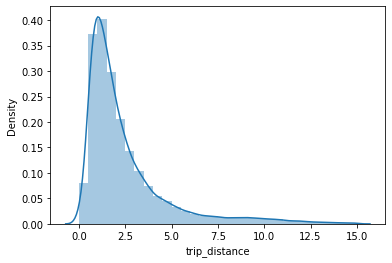

In [23]:
data = df.loc[df['trip_distance'] <= 15, 'trip_distance']

sns.distplot(data, bins=30)
plt.show()

Instant Insights:
- Distribution is positive skewed
- Fare distances are predominantly very short, between 1-3 miles
- There seems to be a fare number of outliers for trips > 15 miles
- Perhaps we should do a correlation check. Recall that we had negative fares for some reason...

In [24]:
# pearson (by default) correlation table for distance and fare amount
df[['trip_distance','fare_amount']].corr(method='pearson')

,trip_distance,fare_amount
trip_distance,1.000000,0.908824
fare_amount,0.908824,1.000000


### Correlation Heatmap

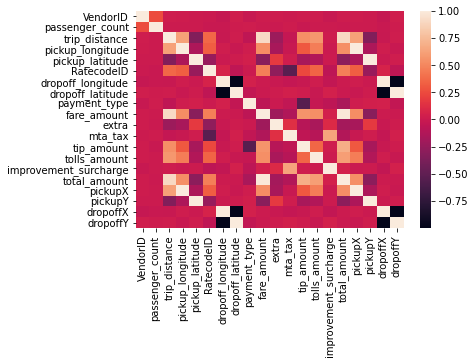

In [25]:
sns.heatmap(df.corr())
# wow that's easy...

plt.show()

Things to take note of:
- `trip_distance` highly correlates with high tips, tolls and overall trip amount
- `payment_type` seems to have some form of negative correlation with `tip_amount`. Must be careful as this is a discrete category.


In [26]:
CORR_COLS = ["passenger_count", "trip_distance", "fare_amount", "extra", 
 "mta_tax", "tip_amount", "tolls_amount", "improvement_surcharge", "total_amount"]

df[CORR_COLS].corr()

,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
passenger_count,1.000000,0.001451,0.001224,-0.002976,0.012582,-0.010832,0.006539,0.003286,-0.000435
trip_distance,0.001451,1.000000,0.908824,-0.225721,-0.031922,0.532309,0.573282,0.015237,0.905526
fare_amount,0.001224,0.908824,1.000000,-0.205621,-0.128376,0.558964,0.535853,0.040833,0.982397
extra,-0.002976,-0.225721,-0.205621,1.000000,0.132070,-0.099397,-0.158907,0.094187,-0.185133
mta_tax,0.012582,-0.031922,-0.128376,0.132070,1.000000,-0.058982,-0.100223,0.633348,-0.121724
tip_amount,-0.010832,0.532309,0.558964,-0.099397,-0.058982,1.000000,0.359367,0.016545,0.687127
tolls_amount,0.006539,0.573282,0.535853,-0.158907,-0.100223,0.359367,1.000000,0.004320,0.607915
improvement_surcharge,0.003286,0.015237,0.040833,0.094187,0.633348,0.016545,0.004320,1.000000,0.041680
total_amount,-0.000435,0.905526,0.982397,-0.185133,-0.121724,0.687127,0.607915,0.041680,1.000000


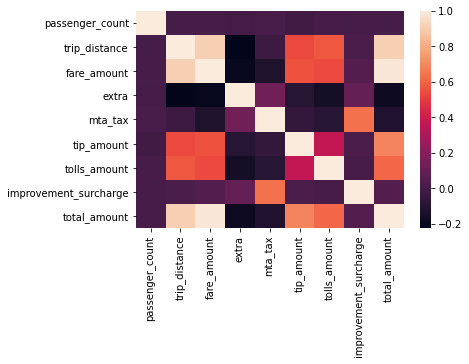

In [27]:
sns.heatmap(df[CORR_COLS].corr())
plt.show()

- If you're interested in calculating correlation between nominal and continuous data, here's a !(great explanation)[https://stats.stackexchange.com/questions/119835/correlation-between-a-nominal-iv-and-a-continuous-dv-variable/124618#124618].   
- Remember, you need to refer back to the data dictionary as well as the fare page: https://www1.nyc.gov/site/tlc/passengers/taxi-fare.page

- You should especially take note of the fare page if you're looking to see how `RatecodeID` plays a role on the fare.

### Binning Methods
Sturges:  
- $bins = ceil(log_2(n)) + 1$

Rice:
- $bins = 2\times\sqrt[3]{n}$

Scott:
- $bins = \frac{max - min}{3.5\times \frac{SD}{\sqrt[3]{n}}}$

Freedman:
- $bins = \frac{max - min}{2\times \frac{IQR}{\sqrt[3]{n}}}$

Square:
- $bins = \sqrt{n}$

(Source: https://www.answerminer.com/blog/binning-guide-ideal-histogram)

In [28]:
# dataframes method that may be of use
MAX = df['fare_amount'].max()
MIN = df['fare_amount'].min()
SD = df['fare_amount'].std()
IQR = df['fare_amount'].quantile()
N = len(df)

Functions that implement specific binning methods. Feel free to use them if you would like so long as they are attributed.

In [29]:
def sturges(x):
    from numpy import log2
    return int(log2(x)) + 1

def rice(x):
    return int(2 * x ** (1/3))

def scott(large, small, sd, x):
    return int((large - small) / (3.5 * (sd/x ** (1/3))))

def freedman(large, small, iqr, x):
    return int((large - small) / (2 * (iqr/x ** (1/3))))
    
def square(x):
    return int(sqrt(x))

def logify(x):
    return log(x) if x else 0

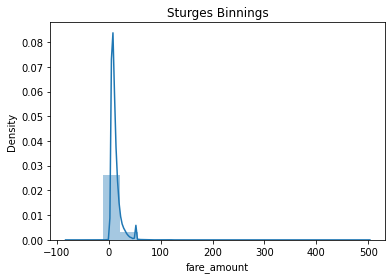

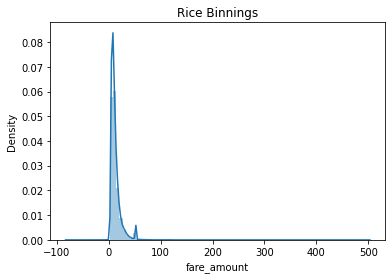

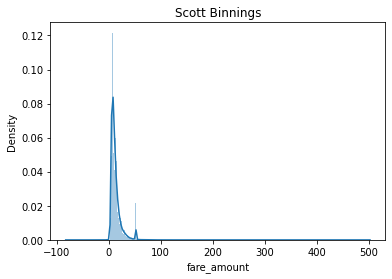

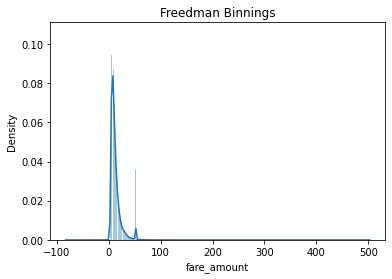

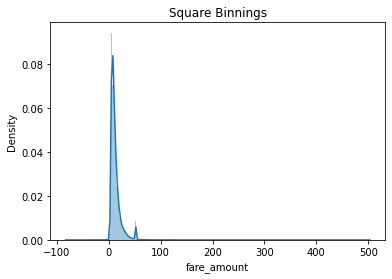

In [30]:
fig1 = sns.distplot(df['fare_amount'], bins=sturges(N))
plt.title("Sturges Binnings")
plt.show()

fig2 = sns.distplot(df['fare_amount'], bins=rice(N))
plt.title("Rice Binnings")
plt.show()

fig3 = sns.distplot(df['fare_amount'], bins=scott(MAX, MIN, SD, N))
plt.title("Scott Binnings")
plt.show()

fig4 = sns.distplot(df['fare_amount'], bins=freedman(MAX, MIN, IQR, N))
plt.title("Freedman Binnings")
plt.show()

fig5 = sns.distplot(df['fare_amount'], bins=square(N))
plt.title("Square Binnings")
plt.show()

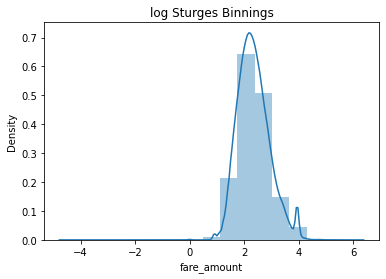

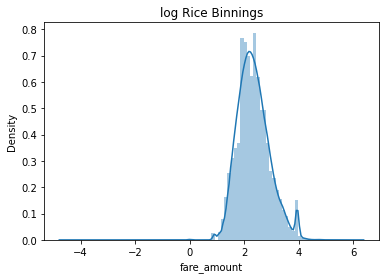

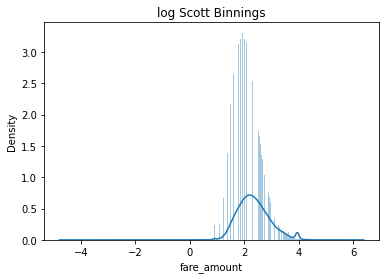

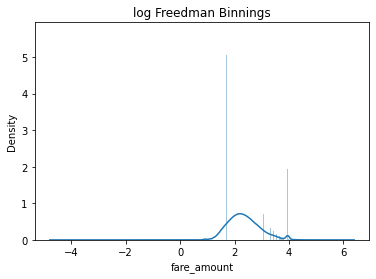

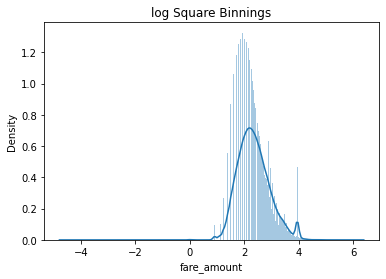

In [31]:
fig1 = sns.distplot(df['fare_amount'].apply(logify), bins=sturges(N))
plt.title("log Sturges Binnings")
plt.show()

fig2 = sns.distplot(df['fare_amount'].apply(logify), bins=rice(N))
plt.title("log Rice Binnings")
plt.show()

fig3 = sns.distplot(df['fare_amount'].apply(logify), bins=scott(MAX, MIN, SD, N))
plt.title("log Scott Binnings")
plt.show()

fig4 = sns.distplot(df['fare_amount'].apply(logify), bins=freedman(MAX, MIN, IQR, N))
plt.title("log Freedman Binnings")
plt.show()

fig5 = sns.distplot(df['fare_amount'].apply(logify), bins=square(N))
plt.title("log Square Binnings")
plt.show()

- Rice's method for binning looks good **for this plot**
- Not always the case, keep that in mind...

_________________


## Pre-Requisite Tasks for the Apache Spark tutorial

### WSL Environment for Windows 10
Refer to this guide to get a native Linux terminal in Windows 10:
- https://github.com/akiratwang/COMP20003-Setting-Up
- Ignore all the `C` related parts, just get Ubuntu installed.

### Apache Spark 3.0 (PySpark) Installation
- Visit `MAST30034/advanced_tutorials/Spark%20Installation.ipynb`

## Today
### Apache Spark 3.0 (PySpark and Spark SQL) Tutorial
- Visit `MAST30034/advanced_tutorials/Spark%20Tutorial.ipynb`